# Kütüphane tanımlama

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
import optuna
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
import matplotlib.ticker as mtick
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.metrics import accuracy_score
import plotly.graph_objs as go
import plotly.express as px
import json
from sklearn.decomposition import PCA
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

# Veri setini yükleme

In [2]:
# Veri yükleme
df = pd.read_csv("C:\\Users\\Ahmet\\Documents\\Projeler\\Deprem Yıkım AI\\Deprem Yıkım AI\\csv_building_structure.csv", index_col='building_id')

# Nepal Depremden Etkilenen Bölgeler

In [ ]:
nepal_districts = json.load(open("C:\\Users\\Ahmet\\Documents\\Projeler\\Deprem Yıkım AI\\Deprem Yıkım AI\\nepal-districts.geojson", 'r'))

# Mapping dosyasını okuyun
dmapping = pd.read_csv("C:\\Users\\Ahmet\\Documents\\Projeler\\Deprem Yıkım AI\\Deprem Yıkım AI\\ward_vdcmun_district_name_mapping.csv")

# DataFrame oluşturma
temp = np.append(dmapping.district_name.unique(), ['Kavre'])
rows = []
for i in nepal_districts['features']:
    rows.append({
        'district_id': i['id'],
        'district_name': i['properties']['DISTRICT'],
        'damage_status': 'Damaged' if i['properties']['DISTRICT'].capitalize() in temp else 'Undamaged'
    })
districts = pd.DataFrame(rows)

# Choropleth çizimi
fig = px.choropleth(
    districts,
    locations="district_name",
    geojson=nepal_districts,
    color="damage_status",
    hover_name="district_name",
    color_discrete_sequence=['#588bed', "#f24444"],
    featureidkey='properties.DISTRICT'
)
# Scattergeo ekleme
fig.add_trace(
    go.Scattergeo(
        text=['Nepal'],
        lat=[28.3947],
        lon=[84.1240],
        textfont={"color": "black", 'size': 22},
        mode='text',
        textposition='bottom left'
    )
)

# Harita güncelleme
fig.update_geos(fitbounds="locations", visible=False, landcolor='#9c9c9c')
fig.update_layout(showlegend=False)
fig.show()

# Veri Ön İzleme

In [4]:
df.columns

Index(['district_id', 'vdcmun_id', 'ward_id', 'count_floors_pre_eq',
       'count_floors_post_eq', 'age_building', 'plinth_area_sq_ft',
       'height_ft_pre_eq', 'height_ft_post_eq', 'land_surface_condition',
       'foundation_type', 'roof_type', 'ground_floor_type', 'other_floor_type',
       'position', 'plan_configuration', 'has_superstructure_adobe_mud',
       'has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag',
       'has_superstructure_cement_mortar_stone',
       'has_superstructure_mud_mortar_brick',
       'has_superstructure_cement_mortar_brick', 'has_superstructure_timber',
       'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
       'has_superstructure_rc_engineered', 'has_superstructure_other',
       'condition_post_eq', 'damage_grade', 'technical_solution_proposed'],
      dtype='object')

In [5]:
df.head()

,district_id,vdcmun_id,ward_id,count_floors_pre_eq,count_floors_post_eq,age_building,plinth_area_sq_ft,height_ft_pre_eq,height_ft_post_eq,land_surface_condition,...,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,condition_post_eq,damage_grade,technical_solution_proposed
building_id,,,,,,,,,,,,,,,,,,,,,
120101000011,12,1207,120703,1,1,9,288,9,9,Flat,...,0,0,0,1,0,0,0,Damaged-Used in risk,Grade 3,Major repair
120101000021,12,1207,120703,1,1,15,364,9,9,Flat,...,0,0,0,1,0,0,0,Damaged-Repaired and used,Grade 5,Reconstruction
120101000031,12,1207,120703,1,1,20,384,9,9,Flat,...,0,0,0,0,0,0,0,Damaged-Repaired and used,Grade 2,Minor repair
120101000041,12,1207,120703,1,1,20,312,9,9,Flat,...,0,0,0,0,0,0,0,Damaged-Repaired and used,Grade 2,Minor repair
120101000051,12,1207,120703,1,1,30,308,9,9,Flat,...,0,0,0,0,0,0,0,Damaged-Repaired and used,Grade 1,Minor repair


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 762094 entries, 120101000011 to 366709001281
Data columns (total 30 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   district_id                             762094 non-null  int64 
 1   vdcmun_id                               762094 non-null  int64 
 2   ward_id                                 762094 non-null  int64 
 3   count_floors_pre_eq                     762094 non-null  int64 
 4   count_floors_post_eq                    762094 non-null  int64 
 5   age_building                            762094 non-null  int64 
 6   plinth_area_sq_ft                       762094 non-null  int64 
 7   height_ft_pre_eq                        762094 non-null  int64 
 8   height_ft_post_eq                       762094 non-null  int64 
 9   land_surface_condition                  762094 non-null  object
 10  foundation_type                         7620

In [7]:
df.describe()

,district_id,vdcmun_id,ward_id,count_floors_pre_eq,count_floors_post_eq,age_building,plinth_area_sq_ft,height_ft_pre_eq,height_ft_post_eq,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other
count,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000,762094.000000
mean,25.767912,2582.695976,258275.039247,2.087787,1.252050,24.325031,406.673668,16.049424,9.868785,0.042402,0.800269,0.035122,0.015816,0.022962,0.071527,0.258770,0.080484,0.039794,0.016386,0.012026
std,5.807569,581.174161,58117.487798,0.655104,1.063278,65.034555,226.780437,5.493900,8.574218,0.201504,0.399799,0.184087,0.124762,0.149782,0.257703,0.437959,0.272040,0.195476,0.126956,0.109002
min,12.000000,1201.000000,120101.000000,1.000000,0.000000,0.000000,70.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,2204.000000,220402.000000,2.000000,0.000000,9.000000,280.000000,12.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,24.000000,2410.000000,241004.000000,2.000000,1.000000,16.000000,358.000000,16.000000,11.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,30.000000,3010.000000,301006.000000,2.000000,2.000000,27.000000,470.000000,18.000000,16.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,36.000000,3611.000000,361108.000000,9.000000,9.000000,999.000000,5000.000000,99.000000,99.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
df.isnull().sum()

district_id                               0
vdcmun_id                                 0
ward_id                                   0
count_floors_pre_eq                       0
count_floors_post_eq                      0
age_building                              0
plinth_area_sq_ft                         0
height_ft_pre_eq                          0
height_ft_post_eq                         0
land_surface_condition                    0
foundation_type                           0
roof_type                                 0
ground_floor_type                         0
other_floor_type                          0
position                                  0
plan_configuration                        0
has_superstructure_adobe_mud              0
has_superstructure_mud_mortar_stone       0
has_superstructure_stone_flag             0
has_superstructure_cement_mortar_stone    0
has_superstructure_mud_mortar_brick       0
has_superstructure_cement_mortar_brick    0
has_superstructure_timber       

# Veri Temizleme

In [9]:
# Sütun adlarındaki boşlukları temizleme
df.columns = df.columns.str.strip()

df.columns = df.columns.str.replace(' ', '_')  # Boşlukları alt çizgiyle değiştirir

# Sütun adlarını tekrar kontrol etme
print(df.columns)

Index(['district_id', 'vdcmun_id', 'ward_id', 'count_floors_pre_eq',
       'count_floors_post_eq', 'age_building', 'plinth_area_sq_ft',
       'height_ft_pre_eq', 'height_ft_post_eq', 'land_surface_condition',
       'foundation_type', 'roof_type', 'ground_floor_type', 'other_floor_type',
       'position', 'plan_configuration', 'has_superstructure_adobe_mud',
       'has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag',
       'has_superstructure_cement_mortar_stone',
       'has_superstructure_mud_mortar_brick',
       'has_superstructure_cement_mortar_brick', 'has_superstructure_timber',
       'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
       'has_superstructure_rc_engineered', 'has_superstructure_other',
       'condition_post_eq', 'damage_grade', 'technical_solution_proposed'],
      dtype='object')


In [10]:
# Veri temizleme
# Metin sütunlarındaki boşlukları temizle
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].str.strip()

In [11]:
# Eksik değer kontrolü ve doldurma
missing_values = df.isnull().sum()
if missing_values.any():
    print("Eksik değerler tespit edildi:")
    print(missing_values[missing_values > 0])
    df.dropna(inplace=True)  # Basitlik için eksik verileri kaldırıyoruz

In [12]:
# Benzersiz değerlerin analiz edilmesi
print("Benzersiz değer sayısı:")
print(df.select_dtypes(include='object').nunique())

Benzersiz değer sayısı:
land_surface_condition          3
foundation_type                 5
roof_type                       3
ground_floor_type               5
other_floor_type                4
position                        4
plan_configuration             10
condition_post_eq               8
damage_grade                    5
technical_solution_proposed     4
dtype: int64


# Veri Ön İşleme

In [13]:
# Hedef değişken ve özellik seçimi
X = df.drop(columns=['damage_grade', 'vdcmun_id', 'ward_id'])  # Gereksiz sütunlar kaldırıldı
y = df['damage_grade']

In [14]:
# Kategorik ve sayısal sütunların ayrıştırılması
categorical_cols = X.select_dtypes(include='object').columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

In [15]:
# Ön işleme adımları
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
        ('num', StandardScaler(), numerical_cols)
    ]
)

In [16]:
# Veriyi eğitim ve test setlerine ayırma
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [17]:
# Model oluşturma
rf_model = RandomForestClassifier(random_state=42)

In [18]:
# Pipeline tanımlama
from sklearn.pipeline import Pipeline
model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', rf_model)
])

# Modeli Eğitme

In [19]:
# Modeli eğitme
model_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  Index(['land_surface_condition', 'foundation_type', 'roof_type',
       'ground_floor_type', 'other_floor_type', 'position',
       'plan_configuration', 'condition_post_eq',
       'technical_solution_proposed'],
      dtype='object')),
                                                 ('num', StandardScaler(),
                                                  Index(['distric...
       'has_superstructure_cement_mortar_stone',
       'has_superstructure_mud_mortar_brick',
       'has_superstructure_cement_mortar_brick', 'has_superstructure_timber',
       'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
       'has_superstructure_rc_engineered', 'has_superstructure_other'],
      dtype='object'))])),
                ('classifier', RandomForestClassifier(random_state=42))])

In [20]:
# Tahmin yapma
y_pred = model_pipeline.predict(X_test)

In [21]:
# Performans değerlendirmesi
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("Classification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[14260  1434    41    28     0]
 [  708 14272  2141   327     3]
 [   47  1877 20738  4592    29]
 [    7    96  3601 32692   373]
 [    2    10    57  2310 52774]]
Classification Report:
              precision    recall  f1-score   support

     Grade 1       0.95      0.90      0.93     15763
     Grade 2       0.81      0.82      0.81     17451
     Grade 3       0.78      0.76      0.77     27283
     Grade 4       0.82      0.89      0.85     36769
     Grade 5       0.99      0.96      0.97     55153

    accuracy                           0.88    152419
   macro avg       0.87      0.87      0.87    152419
weighted avg       0.89      0.88      0.88    152419



In [22]:
# Önemli özelliklerin görselleştirilmesi
importances = rf_model.feature_importances_
feature_names = np.hstack([
    preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_cols),
    numerical_cols
])

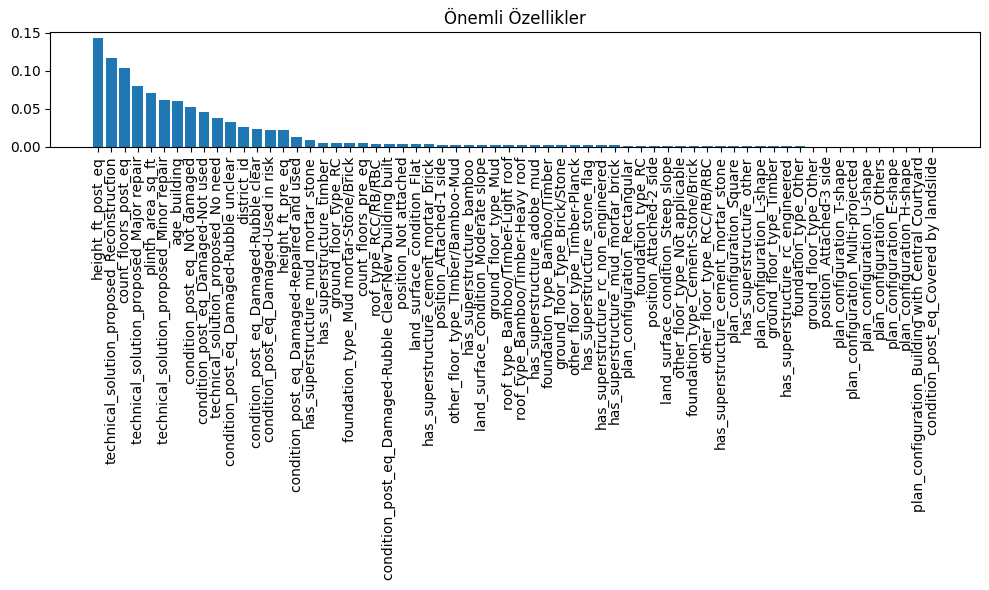

In [23]:
# Önem sırasına göre sıralama
sorted_indices = np.argsort(importances)[::-1]
plt.figure(figsize=(10, 6))
plt.title("Önemli Özellikler")
plt.bar(range(len(importances)), importances[sorted_indices], align="center")
plt.xticks(range(len(importances)), feature_names[sorted_indices], rotation=90)
plt.tight_layout()
plt.show()

XGBoost Modelinin Test Doğruluğu:  88.48 %
XGBoost Modelinin Train Doğruluğu: 88.99 %


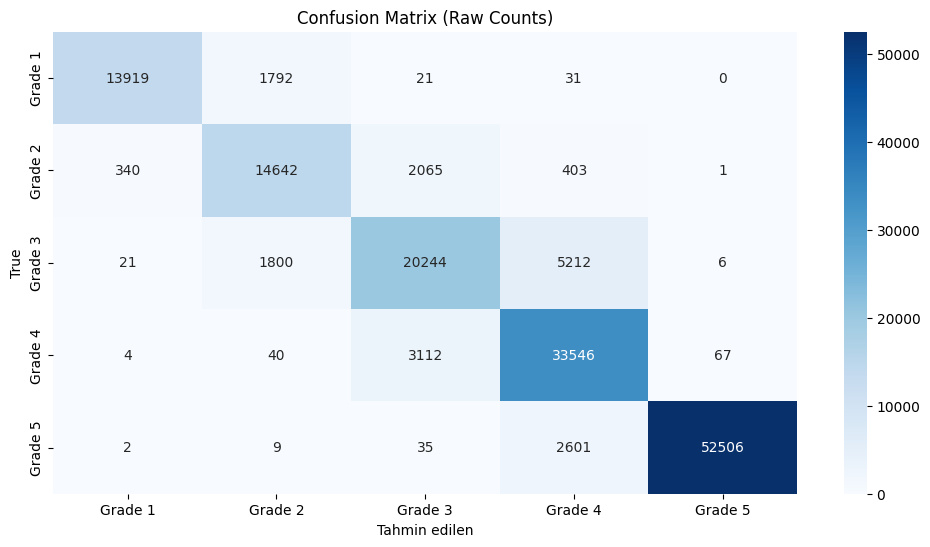

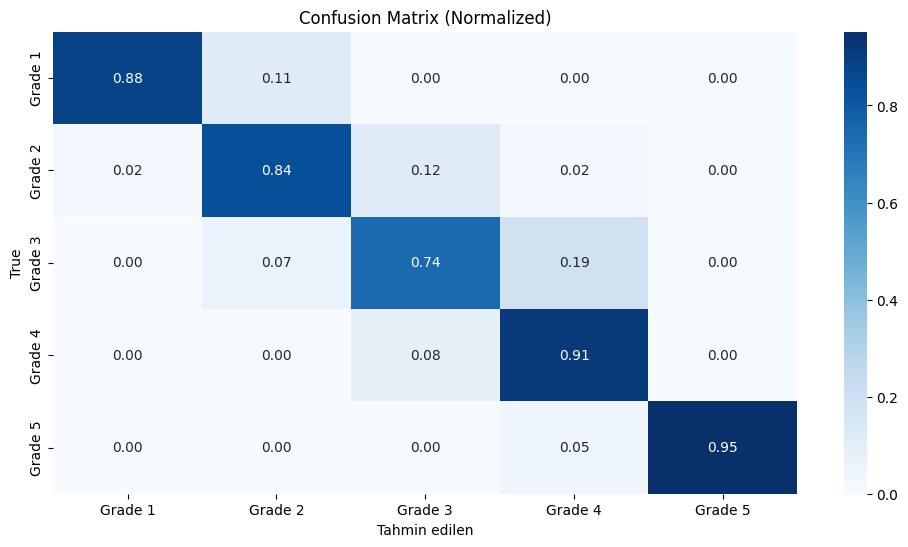

Classification Report:
              precision    recall  f1-score   support

     Grade 1       0.97      0.88      0.93     15763
     Grade 2       0.80      0.84      0.82     17451
     Grade 3       0.79      0.74      0.77     27283
     Grade 4       0.80      0.91      0.85     36769
     Grade 5       1.00      0.95      0.97     55153

    accuracy                           0.88    152419
   macro avg       0.87      0.87      0.87    152419
weighted avg       0.89      0.88      0.89    152419



In [24]:
# Hedef değişkeni sayısallaştırma
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['damage_grade'])  # Sayısal hale getirilmiş hedef değişken

# Kategorik ve sayısal sütunların ayrıştırılması
categorical_cols = X.select_dtypes(include='object').columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Ön işleme pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
        ('num', StandardScaler(), numerical_cols)
    ]
)

# Eğitim ve test setine ayırma
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Pipeline olmadan doğrudan model
xgb_model = xgb.XGBClassifier(random_state=42, eval_metric='mlogloss')

# Veri ön işleme ve model eğitimi
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

xgb_model.fit(X_train_preprocessed, y_train)

# Tahminler
y_pred = xgb_model.predict(X_test_preprocessed)

# Doğruluk skorları
print('XGBoost Modelinin Test Doğruluğu: ', round(100 * xgb_model.score(X_test_preprocessed, y_test), 2), '%')
print('XGBoost Modelinin Train Doğruluğu:', round(100 * xgb_model.score(X_train_preprocessed, y_train), 2), '%')

# Confusion Matrix
con_mat = confusion_matrix(y_test, y_pred)

# Ham Confusion Matrix görselleştirme
plt.figure(figsize=(12, 6))
sns.heatmap(con_mat, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix (Raw Counts)")
plt.xlabel("Tahmin edilen")
plt.ylabel("True")
plt.show()

# Normalize edilmiş Confusion Matrix
con_mat_normalized = con_mat.astype(float) / con_mat.sum(axis=1, keepdims=True)

plt.figure(figsize=(12, 6))
sns.heatmap(con_mat_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix (Normalized)")
plt.xlabel("Tahmin edilen")
plt.ylabel("True")
plt.show()

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

Linear Regression Performance:
Mean Squared Error (MSE): 0.13143448257102772
Mean Absolute Error (MAE): 0.1837762185418776
R^2 Score: 0.9270853428289081


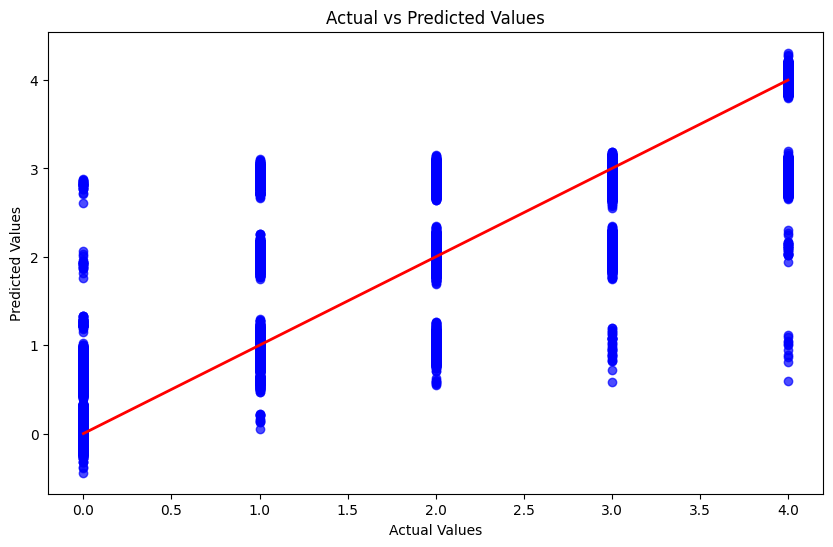

In [25]:
# Linear Regression pipeline
lin_reg_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Modeli eğitme
lin_reg_model.fit(X_train, y_train)

# Tahminler
y_pred = lin_reg_model.predict(X_test)

# Performans metrikleri
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Sonuçları yazdırma
print("Linear Regression Performance:")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R^2 Score: {r2}")

# Örnek görselleştirme: Gerçek ve Tahmin Edilen Değerler


plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7, color='b')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()


In [26]:
comparison = pd.DataFrame({'Gerçek Değerler': y_test, 'Tahmin Edilen Değerler': y_pred})
print(comparison.head())

   Gerçek Değerler  Tahmin Edilen Değerler
0                4                4.006398
1                0                0.009716
2                3                2.915402
3                3                2.891718
4                0                0.150804


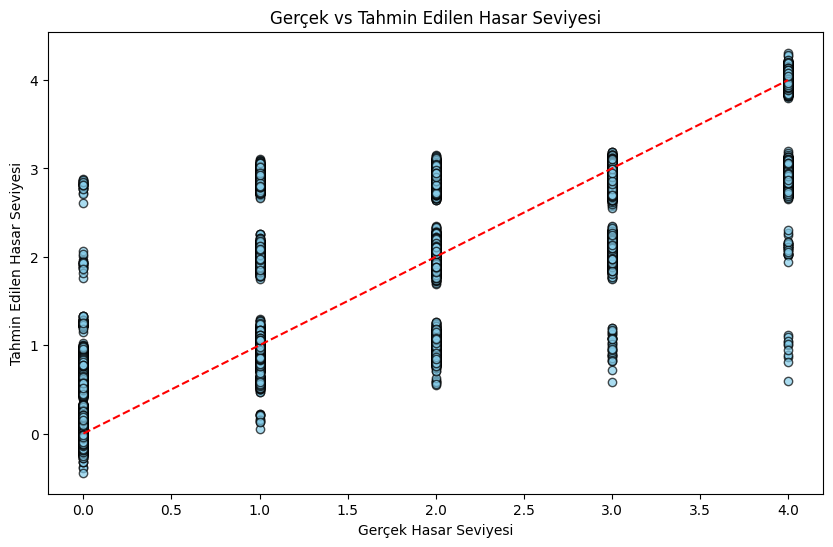

In [27]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='skyblue', edgecolor='black', alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Y = X çizgisi
plt.title('Gerçek vs Tahmin Edilen Hasar Seviyesi')
plt.xlabel('Gerçek Hasar Seviyesi')
plt.ylabel('Tahmin Edilen Hasar Seviyesi')
plt.show()


Test Accuracy of Decision Tree Model:  83.63 %

Train Accuracy of Decision Tree Model:  99.74 %



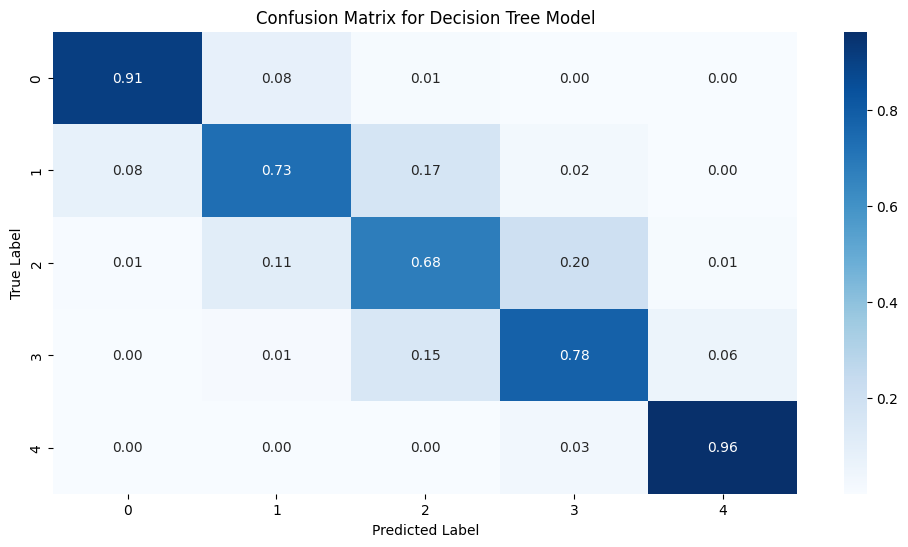

In [28]:
dt_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier())
])

# Fit the model
dt_pipeline.fit(X_train, y_train)

# Predict on the test set
y_pred_dt = dt_pipeline.predict(X_test)

# Calculate confusion matrix
con_mat_dt = confusion_matrix(y_test, y_pred_dt)
con_mat_dt_normalized = con_mat_dt / con_mat_dt.astype(float).sum(axis=1, keepdims=True)

# Print accuracies
print('Test Accuracy of Decision Tree Model: ', round(100 * dt_pipeline.score(X_test, y_test), 2), '%')
print('')
print('Train Accuracy of Decision Tree Model: ', round(100 * dt_pipeline.score(X_train, y_train), 2), '%')
print('')

# Plot Confusion Matrix
plt.figure(figsize=(12, 6))
sns.heatmap(con_mat_dt_normalized, annot=True, fmt=".2f", cmap="Blues")
plt.title("Confusion Matrix for Decision Tree Model")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [29]:
X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.fit_transform(X_test)

In [30]:
def objective(trial):
    params = {
        "n_estimators" : trial.suggest_int('n_estimators', 100, 300),
        "max_depth" : trial.suggest_int('max_depth', 6, 30),
        #"learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
    }
    
    xgb_classifier = xgb.XGBClassifier(**params, n_jobs=-1)
    xgb_classifier.fit(X_train_transformed, y_train)
    
    y_pred = xgb_classifier.predict(X_test_transformed)
    accuracy = accuracy_score(y_test, y_pred)
    
    return accuracy

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

[I 2025-01-05 21:33:36,765] A new study created in memory with name: no-name-ae6e5254-6f2f-4bc6-8b9e-3c452272fc7a
[I 2025-01-05 21:33:55,822] Trial 0 finished with value: 0.8147409443704525 and parameters: {'n_estimators': 126, 'max_depth': 10}. Best is trial 0 with value: 0.8147409443704525.
[I 2025-01-05 21:35:18,301] Trial 1 finished with value: 0.8142226362855025 and parameters: {'n_estimators': 210, 'max_depth': 28}. Best is trial 0 with value: 0.8147409443704525.
[I 2025-01-05 21:35:47,682] Trial 2 finished with value: 0.8136124761348651 and parameters: {'n_estimators': 194, 'max_depth': 8}. Best is trial 0 with value: 0.8147409443704525.
[I 2025-01-05 21:36:36,116] Trial 3 finished with value: 0.8144260230023815 and parameters: {'n_estimators': 180, 'max_depth': 15}. Best is trial 0 with value: 0.8147409443704525.
[I 2025-01-05 21:36:56,085] Trial 4 finished with value: 0.8130482420170714 and parameters: {'n_estimators': 102, 'max_depth': 13}. Best is trial 0 with value: 0.81474

In [31]:
best_params = study.best_params
print("Best Parameters:", best_params)

# Train the final model with the best parameters
final_xgb = xgb.XGBClassifier(**best_params)
final_xgb.fit(X_train_transformed, y_train)
y_pred_final = final_xgb.predict(X_test_transformed)
final_accuracy = accuracy_score(y_test, y_pred_final)
print(f"Final Accuracy with Optuna: {final_accuracy}")

Best Parameters: {'n_estimators': 296, 'max_depth': 15}
Final Accuracy with Optuna: 0.8162433817306242


In [32]:
def objective(trial):
    # Define the hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 100,300)
    max_depth = trial.suggest_int('max_depth', 2, 16, log=True)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)

    # Create the Random Forest Classifier with the suggested hyperparameters
    random_forest = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42
    )

    # Train the model
    random_forest.fit(X_train_transformed, y_train)
    y_pred = random_forest.predict(X_test_transformed)

    # Calculate accuracy as the objective to optimize
    accuracy = accuracy_score(y_test, y_pred)
    
    return accuracy

# Create a study object and optimize the objective function
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2025-01-05 23:20:23,383] A new study created in memory with name: no-name-29aafff1-dd8c-4c19-944f-dcc6a06d6779
[I 2025-01-05 23:20:38,682] Trial 0 finished with value: 0.8381041733642132 and parameters: {'n_estimators': 105, 'max_depth': 2, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.8381041733642132.
[I 2025-01-05 23:21:32,394] Trial 1 finished with value: 0.8791817293119624 and parameters: {'n_estimators': 170, 'max_depth': 6, 'min_samples_split': 2, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.8791817293119624.
[I 2025-01-05 23:22:29,087] Trial 2 finished with value: 0.8791882901737972 and parameters: {'n_estimators': 149, 'max_depth': 8, 'min_samples_split': 9, 'min_samples_leaf': 2}. Best is trial 2 with value: 0.8791882901737972.
[I 2025-01-05 23:23:06,743] Trial 3 finished with value: 0.879057072937101 and parameters: {'n_estimators': 141, 'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 2 with value: 0.8

In [33]:
best_params = study.best_params
print("Best Parameters:", best_params)

# Train the final model with the best parameters
final_rf = RandomForestClassifier(**best_params)
final_rf.fit(X_train_transformed, y_train)
y_pred_final = final_rf.predict(X_test_transformed)
final_accuracy = accuracy_score(y_test, y_pred_final)
print(f"Final Accuracy with Optuna: {final_accuracy}")

Best Parameters: {'n_estimators': 271, 'max_depth': 16, 'min_samples_split': 5, 'min_samples_leaf': 1}
Final Accuracy with Optuna: 0.8829017379723001


In [34]:
def objective(trial):
    # Define the hyperparameter search space
    max_depth = trial.suggest_int('max_depth', 2, 32, log=True)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])

    # Create the Decision Tree Classifier with the suggested hyperparameters
    decision_tree = DecisionTreeClassifier(
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        criterion=criterion,
        random_state=42
    )

    # Train the model
    decision_tree.fit(X_train_transformed, y_train)
    y_pred = decision_tree.predict(X_test_transformed)

    # Calculate accuracy as the objective to optimize
    accuracy = accuracy_score(y_test, y_pred)
    
    return accuracy

# Create a study object and optimize the objective function
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2025-01-06 02:38:43,362] A new study created in memory with name: no-name-834b9d65-0dee-4a93-b231-1d600af8ac8e
[I 2025-01-06 02:38:45,259] Trial 0 finished with value: 0.870639487203039 and parameters: {'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 2, 'criterion': 'entropy'}. Best is trial 0 with value: 0.870639487203039.
[I 2025-01-06 02:38:47,124] Trial 1 finished with value: 0.870639487203039 and parameters: {'max_depth': 4, 'min_samples_split': 3, 'min_samples_leaf': 4, 'criterion': 'entropy'}. Best is trial 0 with value: 0.870639487203039.
[I 2025-01-06 02:38:49,339] Trial 2 finished with value: 0.870639487203039 and parameters: {'max_depth': 5, 'min_samples_split': 3, 'min_samples_leaf': 1, 'criterion': 'entropy'}. Best is trial 0 with value: 0.870639487203039.
[I 2025-01-06 02:38:51,842] Trial 3 finished with value: 0.8792145336211364 and parameters: {'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 3, 'criterion': 'gini'}. Best is trial 3 with value:

In [35]:
best_params = study.best_params
print("Best Parameters:", best_params)

# Train the final Decision Tree model with the best parameters
final_dt = DecisionTreeClassifier(**best_params)
final_dt.fit(X_train_transformed, y_train)
y_pred_final = final_dt.predict(X_test_transformed)
final_accuracy = accuracy_score(y_test, y_pred_final)
print(f"Final Accuracy with Optuna: {final_accuracy}")

Best Parameters: {'max_depth': 14, 'min_samples_split': 7, 'min_samples_leaf': 4, 'criterion': 'gini'}
Final Accuracy with Optuna: 0.8837152848398165


In [36]:
# LabelEncoder oluşturulması
label_encoder = LabelEncoder()

# Kategorik sütunları sayısal verilere dönüştürme
for column in df.columns:
    if df[column].dtype == 'object':  # Kategorik sütunlar
        # Eğer sütun kategorikse (object tipi), sayısal verilere dönüştürülür
        df[column] = label_encoder.fit_transform(df[column].astype(str))

# Boş (NaN) değerleri medyan ile doldurma
df.fillna(df.median(), inplace=True)

# Veri tiplerini kontrol etme
print(df.dtypes)

district_id                               int64
vdcmun_id                                 int64
ward_id                                   int64
count_floors_pre_eq                       int64
count_floors_post_eq                      int64
age_building                              int64
plinth_area_sq_ft                         int64
height_ft_pre_eq                          int64
height_ft_post_eq                         int64
land_surface_condition                    int64
foundation_type                           int64
roof_type                                 int64
ground_floor_type                         int64
other_floor_type                          int64
position                                  int64
plan_configuration                        int64
has_superstructure_adobe_mud              int64
has_superstructure_mud_mortar_stone       int64
has_superstructure_stone_flag             int64
has_superstructure_cement_mortar_stone    int64
has_superstructure_mud_mortar_brick     

In [37]:
X = df.drop(columns=['damage_grade', 'vdcmun_id', 'ward_id'])  # Gereksiz sütunlar kaldırıldı
y = df['damage_grade']

# Veriyi eğitim ve test verisine ayırma
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modeli oluşturma
model = LinearRegression()

# Modeli eğitim verisi üzerinde eğitme
model.fit(X_train, y_train)

# Test verisi üzerinde tahmin yapma
y_pred = model.predict(X_test)

# Modelin başarısını değerlendirme
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"R²: {r2}")
print(f"MAE: {mae}")

R²: 0.707369573603685
MAE: 0.5429023256100799


In [38]:
# Modelin katsayıları ve kesişimi (intercept) değerini yazdırma
print("Modelin Katsayıları: ", model.coef_)
print("Modelin Kesişimi: ", model.intercept_)

Modelin Katsayıları:  [ 9.44402778e-03  2.71914753e-01 -4.05461080e-01  1.86598236e-04
  3.39589617e-05  2.39459624e-02 -3.64017187e-02  6.85002307e-02
  3.24117170e-02 -7.40432255e-02 -6.78072170e-02  4.98084639e-02
 -2.17725619e-02  2.33779274e-02  2.63735930e-01  5.54097113e-01
  2.72776423e-01  1.42627131e-01  3.49373278e-01 -2.22091739e-01
 -1.01818221e-01  2.28198832e-02 -1.90565615e-01 -4.67614422e-01
 -1.96658797e-01 -1.03315405e-01  3.04190737e-01]
Modelin Kesişimi:  1.4836790616614046


In [39]:
# İlk 10 tahmin ile gerçek değerleri karşılaştırma
comparison = pd.DataFrame({'Gerçek Değerler': y_test, 'Tahmin Edilen Değerler': y_pred})
print(comparison.head())

              Gerçek Değerler  Tahmin Edilen Değerler
building_id                                          
314402001402                0                1.679289
201103000621                1                2.180878
281106000421                4                3.946904
366402000031                1                1.750738
220402020761                2                1.105195


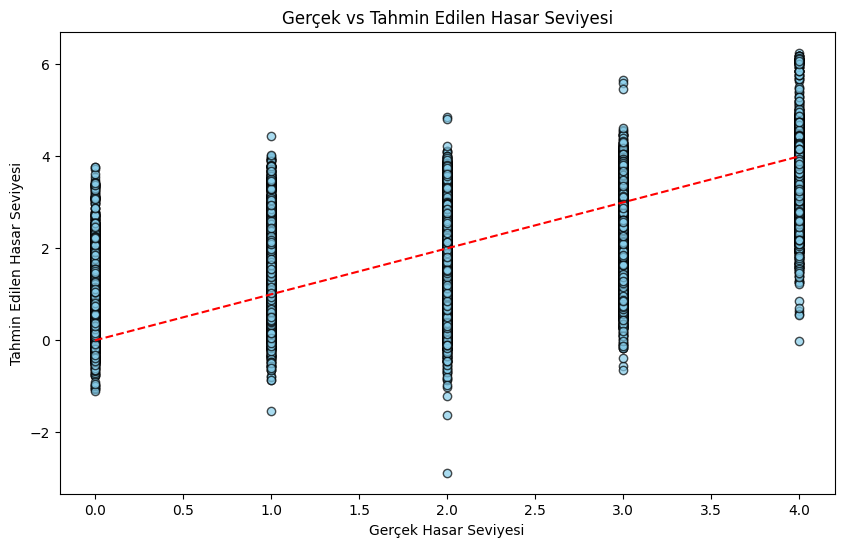

In [40]:
# Gerçek değerler ile tahmin edilen değerlerin karşılaştırılması
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='skyblue', edgecolor='black', alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Y = X çizgisi
plt.title('Gerçek vs Tahmin Edilen Hasar Seviyesi')
plt.xlabel('Gerçek Hasar Seviyesi')
plt.ylabel('Tahmin Edilen Hasar Seviyesi')
plt.show()

# Deprem Etkisi ve Çatı Faktörünün İncelenmesi (Veri Görselleştirme)

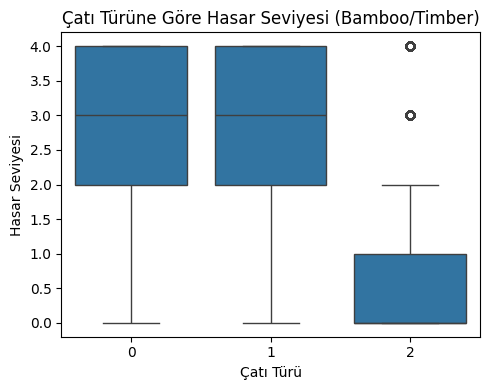

In [41]:
plt.figure(figsize=(5, 4))
sns.boxplot(x='roof_type', y='damage_grade', data=df)
plt.title('Çatı Türüne Göre Hasar Seviyesi (Bamboo/Timber)')
plt.xlabel('Çatı Türü')
plt.ylabel('Hasar Seviyesi')

plt.tight_layout()  # Grafiklerin arasındaki boşlukları düzenler
plt.show()

In [42]:
# Çatı türüne göre hasar seviyelerinin özet istatistiklerini hesaplama
roof_damage_stats = df.groupby('roof_type')['damage_grade'].describe()
print(roof_damage_stats)

              count      mean       std  min  25%  50%  75%  max
roof_type                                                       
0          213774.0  2.804976  1.240669  0.0  2.0  3.0  4.0  4.0
1          503736.0  2.745837  1.280722  0.0  2.0  3.0  4.0  4.0
2           44584.0  0.714808  0.967646  0.0  0.0  0.0  1.0  4.0


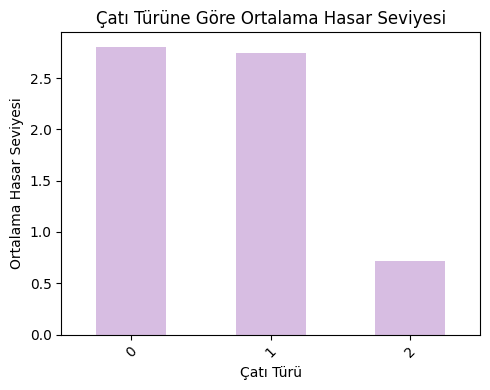

In [43]:
# Çatı türüne göre ortalama hasar seviyesi (Bamboo/Timber)
roof_damage_mean_bamboo = df.groupby('roof_type')['damage_grade'].mean()

# Bar grafiği
plt.figure(figsize=(5, 4))
roof_damage_mean_bamboo.plot(kind='bar', color='#d7bde2')
plt.title('Çatı Türüne Göre Ortalama Hasar Seviyesi')
plt.xlabel('Çatı Türü')
plt.ylabel('Ortalama Hasar Seviyesi')
plt.xticks(rotation=45)

# Görselleştirme
plt.tight_layout()
plt.show()

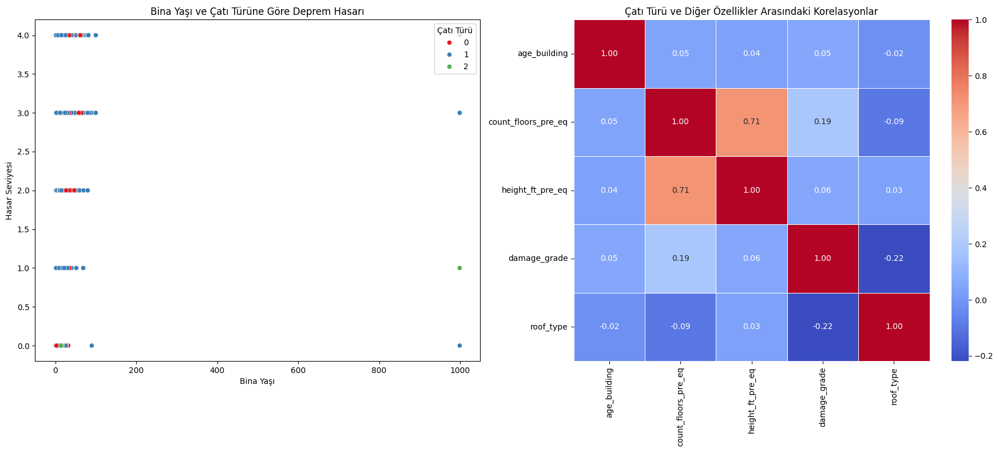

In [44]:
# Yan yana grafikleri oluşturmak için subplot kullanma
fig, axes = plt.subplots(1, 2, figsize=(18, 8))  # 1 satır, 2 sütun

# Scatter plot (Bina Yaşı ve Çatı Türüne Göre Deprem Hasarı)
sample_df = df.sample(n=1000, random_state=42)  # Örnekleme
sns.scatterplot(x='age_building', y='damage_grade', hue='roof_type', data=sample_df, palette='Set1', ax=axes[0])
axes[0].set_title('Bina Yaşı ve Çatı Türüne Göre Deprem Hasarı')
axes[0].set_xlabel('Bina Yaşı')
axes[0].set_ylabel('Hasar Seviyesi')
axes[0].legend(title='Çatı Türü', loc='upper right')  # Lejant konumu

# Çatı türü ve diğer özellikler arasındaki korelasyonu hesaplama
corr_matrix = df[['age_building', 'count_floors_pre_eq', 'height_ft_pre_eq', 'damage_grade'] + 
                  [col for col in df.columns if 'roof_type' in col]].corr()

# Isıl harita (heatmap) görselleştirmesi
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, ax=axes[1])
axes[1].set_title('Çatı Türü ve Diğer Özellikler Arasındaki Korelasyonlar')

# Grafiklerin arasındaki boşlukları düzenleme
plt.tight_layout()

plt.show()


# Deprem Dayanıklılığı Tahmini (Linear Regression, Nonlinear Regression ve Model Değerlendirme)

In [45]:
# Verilerin ölçeklendirilmesi
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Veri setinin son haliyle kontrol
print(X_train_scaled[:5])
print(y_train[:5])

[[ 0.90092617 -0.13352387 -1.17696013  0.10176345  0.01521806  0.72144947
  -1.15071082 -0.42722547  0.15781242  0.41322111 -0.17025659  0.21615699
   0.5035979   0.04261459 -0.21028063  0.49911054 -0.19087672 -0.12712421
  -0.1533789  -0.27753793  1.69199122 -0.29560947 -0.20307123 -0.12857532
  -0.11070905  0.19749505  0.72672254]
 [-0.64839482  1.39494338  0.70473103  0.11709495 -0.37287893  0.35662682
   0.36651551 -0.42722547  0.15781242 -1.44631965 -0.17025659  1.34001222
   0.5035979   0.04261459 -0.21028063  0.49911054 -0.19087672 -0.12712421
  -0.1533789  -0.27753793 -0.59101961 -0.29560947 -0.20307123 -0.12857532
  -0.11070905 -1.22719634  0.72672254]
 [-0.30410127 -0.13352387 -0.23611455  0.853007   -0.38169932  0.35662682
  -0.10032336 -0.42722547  0.15781242  0.41322111 -0.17025659  0.21615699
  -2.09590753  0.04261459 -0.21028063  0.49911054 -0.19087672 -0.12712421
  -0.1533789  -0.27753793 -0.59101961 -0.29560947 -0.20307123 -0.12857532
  -0.11070905 -0.75229921  0.72672

# Linear Regression (Doğrusal Regresyon) Modeli

In [46]:
# Modeli oluşturma ve eğitim
linear_model = LinearRegression()
linear_model.fit(X_train_scaled, y_train)

# Test verisiyle tahmin yapma
y_pred_linear = linear_model.predict(X_test_scaled)

# Model değerlendirme
mse_linear = mean_squared_error(y_test, y_pred_linear)
r2_linear = r2_score(y_test, y_pred_linear)

print("MSE:", mse_linear)
print("R²:", r2_linear)

MSE: 0.5292647352694863
R²: 0.7073695736036851


# Nonlinear Regression (Doğrusal Olmayan Regresyon) Modeli

In [47]:
# Decision Tree modelini oluşturma ve eğitim
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train_scaled, y_train)

# Test verisiyle tahmin yapma
y_pred_dt = dt_model.predict(X_test_scaled)

# Model değerlendirme
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print("Decision Tree - MSE:", mse_dt)
print("Decision Tree - R²:", r2_dt)

Decision Tree - MSE: 0.20635588140509134
Decision Tree - R²: 0.8859058510024997


In [48]:
# Random Forest modelini oluşturma ve eğitim
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train_scaled, y_train)

# Test verisiyle tahmin yapma
y_pred_rf = rf_model.predict(X_test_scaled)

# Model değerlendirme
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print("Random Forest - MSE:", mse_rf)
print("Random Forest - R²:", r2_rf)

Random Forest - MSE: 0.10952842796393654
Random Forest - R²: 0.9394417416431775


# Model Değerlendirme ve Karşılaştırma

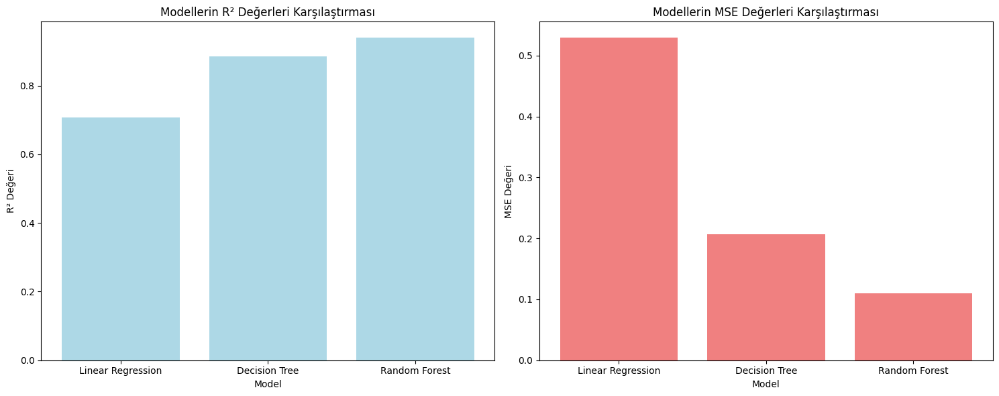

In [49]:
models = ['Linear Regression', 'Decision Tree', 'Random Forest']
r2_scores = [r2_linear, r2_dt, r2_rf]
mse_scores = [mse_linear, mse_dt, mse_rf]

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# R² Değerleri Grafiği
axes[0].bar(models, r2_scores, color='lightblue')
axes[0].set_title('Modellerin R² Değerleri Karşılaştırması')
axes[0].set_xlabel('Model')
axes[0].set_ylabel('R² Değeri')

# MSE Değerleri Grafiği
axes[1].bar(models, mse_scores, color='lightcoral')
axes[1].set_title('Modellerin MSE Değerleri Karşılaştırması')
axes[1].set_xlabel('Model')
axes[1].set_ylabel('MSE Değeri')

# Grafiklerin arasındaki boşlukları düzenleme
plt.tight_layout()
plt.show()

# ROC AUC Skoru ve ROC Eğrisi Analizi ile Deprem Dayanıklılığı Tahmini

In [50]:
# Hedef değişkeni binary sınıfa dönüştürme (damage_grade: 0 -> Hafif Hasar, 1 -> Ağır Hasar)
df['damage_binary'] = np.where(df['damage_grade'] >= 3, 1, 0)

# Özellikler (bağımsız değişkenler) ve hedef değişken (bağımlı değişken)
X = df[['age_building', 'count_floors_pre_eq', 'height_ft_pre_eq']]
y = df['damage_binary']

# Veriyi eğitim ve test setlerine ayırma
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [51]:
# Veriyi ölçeklendirme
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Lojistik regresyon modelini kurma ve eğitme
log_reg_model = LogisticRegression()
log_reg_model.fit(X_train_scaled, y_train)

# Test seti üzerinde tahmin yapma (olasılık değerleri)
y_prob = log_reg_model.predict_proba(X_test_scaled)[:, 1]
y_pred = log_reg_model.predict(X_test_scaled)

ROC AUC Skoru: 0.6269487926601688


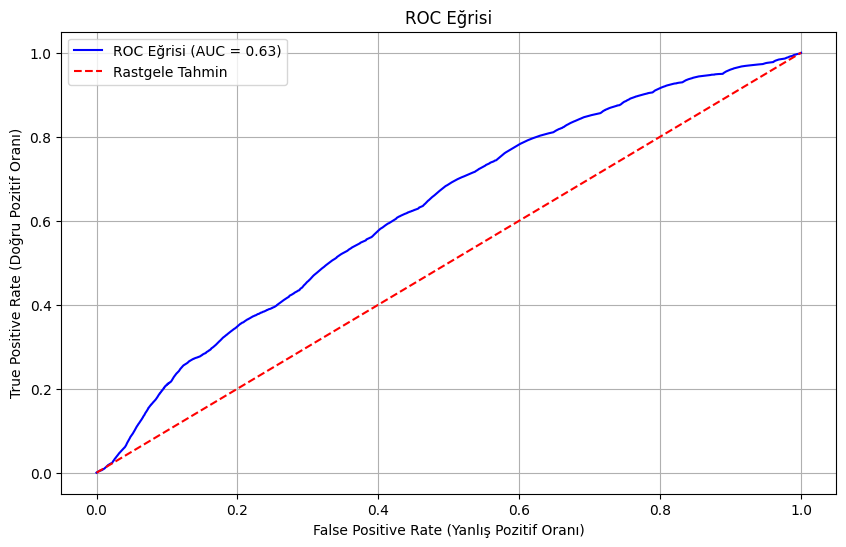

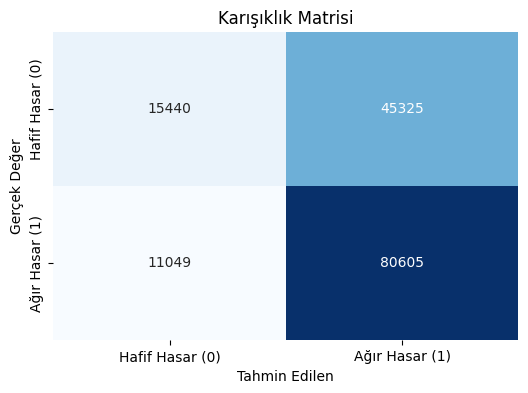

In [52]:
# ROC eğrisi ve AUC skoru
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc_score = roc_auc_score(y_test, y_prob)

print("ROC AUC Skoru:", auc_score)

# ROC eğrisini çizme
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f"ROC Eğrisi (AUC = {auc_score:.2f})")
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Rastgele Tahmin")
plt.title("ROC Eğrisi")
plt.xlabel("False Positive Rate (Yanlış Pozitif Oranı)")
plt.ylabel("True Positive Rate (Doğru Pozitif Oranı)")
plt.legend()
plt.grid()
plt.show()

# Karışıklık matrisi oluşturma
cm = confusion_matrix(y_test, y_pred)

# Matrisin görselleştirilmesi
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=['Hafif Hasar (0)', 'Ağır Hasar (1)'], yticklabels=['Hafif Hasar (0)', 'Ağır Hasar (1)'], cbar=False)

# Başlık ve etiketler
plt.title('Karışıklık Matrisi')
plt.xlabel('Tahmin Edilen')
plt.ylabel('Gerçek Değer')

# Görselleştirmeyi göster
plt.show()

# Kümeleme (Clustering) - Bina Özelliklerine Göre Gruplama

In [53]:
# Özellikler (bağımsız değişkenler)
X = df[['age_building', 'count_floors_pre_eq', 'height_ft_pre_eq']]

# Verilerin ölçeklendirilmesi
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Ölçeklenmiş verinin son haliyle kontrol
print(X_scaled[:5])

[[-0.23564459 -1.66048085 -1.2831375 ]
 [-0.14338588 -1.66048085 -1.2831375 ]
 [-0.06650362 -1.66048085 -1.2831375 ]
 [-0.06650362 -1.66048085 -1.2831375 ]
 [ 0.08726089 -1.66048085 -1.2831375 ]]


# K-means Kümeleme

c:\Users\Ahmet\AppData\Local\Programs\Python\Python313\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning:

Could not find the number of physical cores for the following reason:
[WinError 2] Sistem belirtilen dosyayı bulamıyor
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "c:\Users\Ahmet\AppData\Local\Programs\Python\Python313\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "c:\Users\Ahmet\AppData\Local\Programs\Python\Python313\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Ahmet\AppData\Local\Programs\Python\Python313\Lib\subprocess.py", line 1036, in __init__
    sel

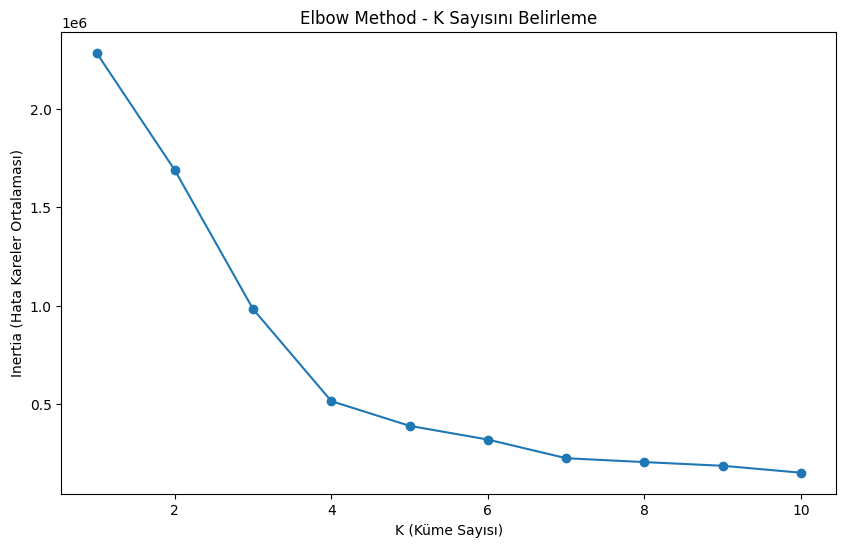

In [54]:
# K Sayısını Belirleme (Elbow Method)
inertia = []
K_range = range(1, 11)

# Farklı K değerleri için K-means modelini eğitme
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Grafik ile Elbow Method
plt.figure(figsize=(10, 6))
plt.plot(K_range, inertia, marker='o')
plt.title('Elbow Method - K Sayısını Belirleme')
plt.xlabel('K (Küme Sayısı)')
plt.ylabel('Inertia (Hata Kareler Ortalaması)')
plt.show()

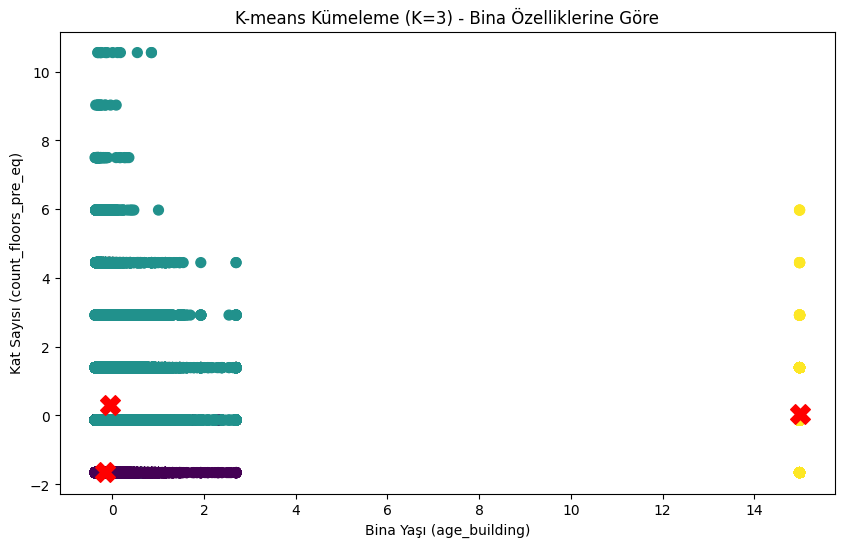

In [55]:
# K-means kümeleme (K = 3)
kmeans = KMeans(n_clusters=3, random_state=42)
y_kmeans = kmeans.fit_predict(X_scaled)

# Kümeleri görselleştirme
plt.figure(figsize=(10, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=y_kmeans, s=50, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='red', s=200, marker='X')
plt.title('K-means Kümeleme (K=3) - Bina Özelliklerine Göre')
plt.xlabel('Bina Yaşı (age_building)')
plt.ylabel('Kat Sayısı (count_floors_pre_eq)')
plt.show()

In [56]:
# Küme sonuçlarını veri setine ekleme
df['cluster'] = y_kmeans

# Küme sonuçlarını inceleme
print(df[['age_building', 'count_floors_pre_eq', 'height_ft_pre_eq', 'cluster']].head())

# Her küme için ortalama değerleri inceleme
print(df.groupby('cluster')[['age_building', 'count_floors_pre_eq', 'height_ft_pre_eq']].mean())

              age_building  count_floors_pre_eq  height_ft_pre_eq  cluster
building_id                                                               
120101000011             9                    1                 9        0
120101000021            15                    1                 9        0
120101000031            20                    1                 9        0
120101000041            20                    1                 9        0
120101000051            30                    1                 9        0
         age_building  count_floors_pre_eq  height_ft_pre_eq
cluster                                                     
0           14.015559             1.020050          9.373795
1           21.473445             2.289556         17.308083
2          999.000000             2.118639         16.815840


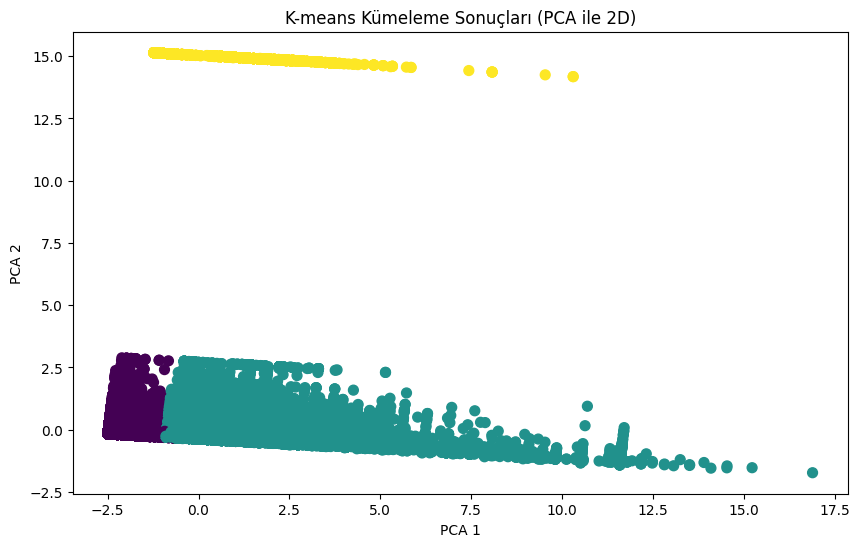

In [57]:


# Veriyi 2D'ye indirgeme
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Kümeleme sonuçlarıyla görselleştirme
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_kmeans, s=50, cmap='viridis')
plt.title('K-means Kümeleme Sonuçları (PCA ile 2D)')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

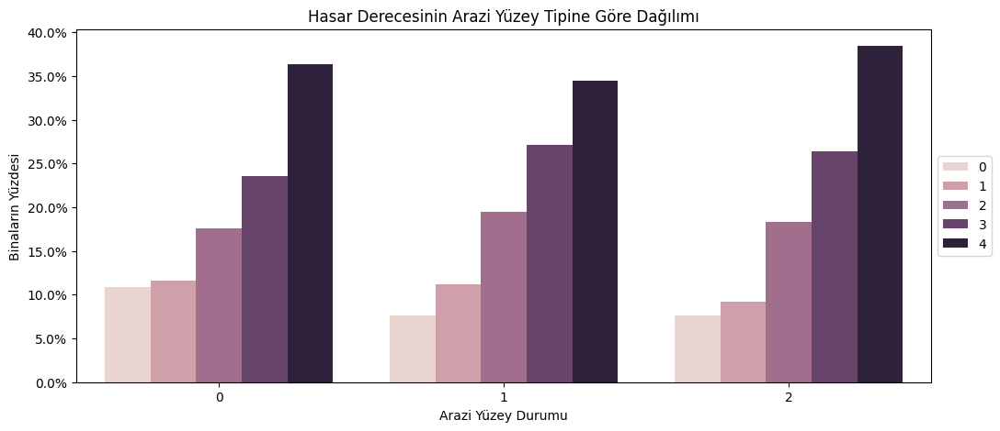

In [58]:
df_temp = df.groupby(['land_surface_condition', 'damage_grade']).size().reset_index(name='count')

# Calculate Proportion of grade
df_temp['proportion'] = df_temp.groupby('land_surface_condition')['count'].transform(lambda x: 100 * x / x.sum())

# Plot chart
plt.figure(figsize=(12, 5))
ax = sns.barplot(data=df_temp, 
                 x='land_surface_condition', 
                 y='proportion', 
                 hue='damage_grade')
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.title("Hasar Derecesinin Arazi Yüzey Tipine Göre Dağılımı")
plt.xlabel("Arazi Yüzey Durumu")
plt.ylabel("Binaların Yüzdesi")
plt.show()

# Clean up
del df_temp, ax

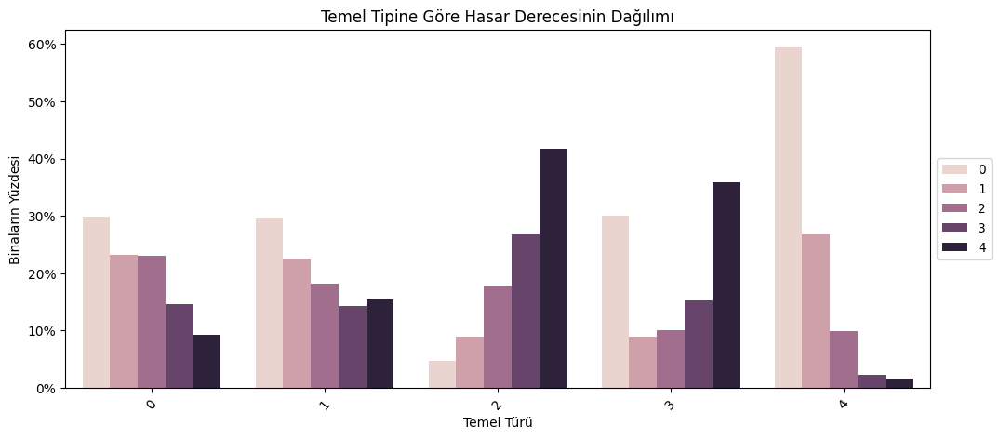

In [59]:
# Calculate counts
df_temp = df.groupby(['foundation_type', 'damage_grade']).size().reset_index(name='count')

# Calculate Proportion of grade
df_temp['proportion'] = df_temp.groupby('foundation_type')['count'].transform(lambda x: 100 * x / x.sum())

# Plot chart
plt.figure(figsize=(12, 5))
ax = sns.barplot(data=df_temp, 
                 x='foundation_type', 
                 y='proportion', 
                 hue='damage_grade')
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
plt.xticks(rotation=50)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.title("Temel Tipine Göre Hasar Derecesinin Dağılımı")
plt.xlabel("Temel Türü")
plt.ylabel("Binaların Yüzdesi")
plt.show()

# Clean up
del df_temp, ax

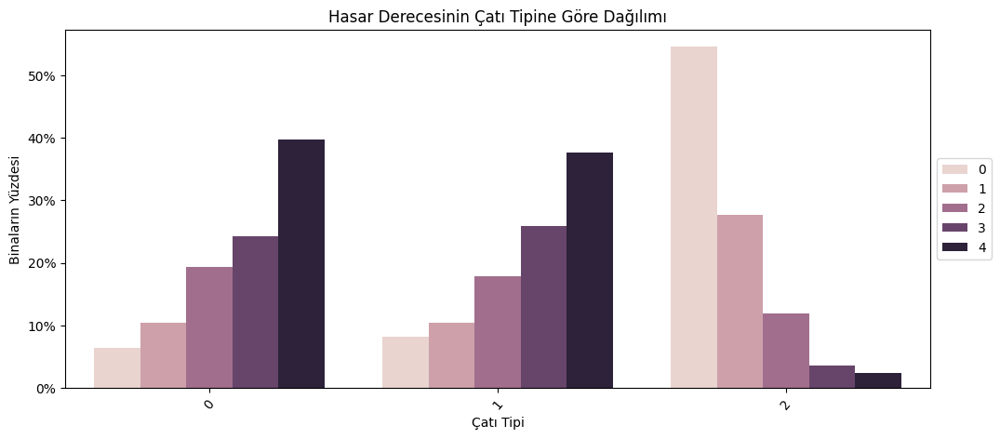

In [60]:
# Calculate counts
df_temp = df.groupby(['roof_type', 'damage_grade']).size().reset_index(name='count')

# Calculate Proportion of grade
df_temp['proportion'] = df_temp.groupby('roof_type')['count'].transform(lambda x: 100 * x / x.sum())

# Plot chart
plt.figure(figsize=(12, 5))
ax = sns.barplot(data=df_temp, 
                 x='roof_type', 
                 y='proportion', 
                 hue='damage_grade')
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
plt.xticks(rotation=50)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
plt.title("Hasar Derecesinin Çatı Tipine Göre Dağılımı")
plt.xlabel("Çatı Tipi")
plt.ylabel("Binaların Yüzdesi")
plt.show()

# Clean up
del df_temp, ax